In [ ]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm, tnrange
import os
import re
import json
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import wordnet as wn
from nltk import ngrams
from wordcloud import WordCloud
import warnings
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import pyLDAvis
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
import spacy
from collections import Counter
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from gensim.models import Word2Vec
from nltk import ngrams
from cleantext import clean

In [ ]:
warnings.filterwarnings('ignore')

In [ ]:
weekly_df1=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly 15. Less Than 250.csv")

In [ ]:
from gensim.models import FastText

# Load the saved FastText model
model = FastText.load("fasttext_post_Classification")

# Access the vocabulary
vocab = model.wv.key_to_index

In [ ]:
iw = ['devoted', 'parish', 'service', 'tradition', 'gospel', 'liturgy', 'anglican', 'teaching', 'worship', 'glorify_god', 'spiritual', 'open_hearts', 'bible_believing', 'great_commission', 'help', 'inspired_word', 'one_another', 'transformation_world', 'old_new_testament', 'educate']
ideology_words=[]
for i in iw:
    if i in vocab:
        ideology_words.append(i)
    else:
        print(i)

glorify_god
bible_believing
inspired_word
transformation_world


In [ ]:
gw = ['community', 'family', 'congregation', 'join', 'invite', 'reach', 'diversity', 'grow', 'come', 'welcome', 'friendly', 'bring', 'newcomers', 'meet', 'connect', 'volunteers', 'evangelical', 'cultural', 'making_disciples', 'unity', 'missionaries', 'committed_helping', 'christian_fellowship', 'spiritual_growth']
growth_words=[]
for i in gw:
    if i in vocab:
        growth_words.append(i)
    else:
        print(i)

committed_helping
christian_fellowship


In [ ]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations


In [ ]:
growth_vectors=[model.wv[word] for word in growth_words if word in vocab]
ideology_vectors=[model.wv[word] for word in ideology_words if word in vocab]


weekly_df1['growth_sim_score'] = 0.0
weekly_df1['ideology_sim_score'] = 0.0
weekly_df1['Upper_score_Aim'] = 'NaN'

weekly_df1['growth_sim_score_lower'] = 0.0
weekly_df1['ideology_sim_score_lower'] = 0.0
weekly_df1['Lower_score_Aim'] = 'NaN'

weekly_df1['growth_sim_score_avg'] = 0.0
weekly_df1['ideology_sim_score_avg'] = 0.0
weekly_df1['mean_sim_score_Aim'] = 'NaN'

weekly_df1['growth_sim_overlap'] = 0.0
weekly_df1['ideology_sim_overlap'] = 0.0
weekly_df1['overlap_sim_Aim']='NaN'

growth_len = len(growth_words)
ideology_len = len(ideology_words)

weekly_df1=weekly_df1.reset_index()

In [ ]:
for index, row in weekly_df1.iterrows():
    detail=list(sent_to_words(weekly_df1['tidy_details_no_stop']))[index]
    sent = [word for word in detail if word in vocab]

    if len(sent)>0:
        word_vectors = [model.wv[word] for word in sent]
        cos_sims_growth = np.max(cosine_similarity(word_vectors, growth_vectors), axis=1)
        cos_sims_ideology = np.max(cosine_similarity(word_vectors, ideology_vectors), axis=1)

        cos_sims_growth.sort()
        cos_sims_ideology.sort()

        mean_sim_growth, mean_sim_ideology = cos_sims_growth[-3:].mean(), cos_sims_ideology[-3:].mean()
        weekly_df1['growth_sim_score'][index], weekly_df1['ideology_sim_score'][index] = mean_sim_growth, mean_sim_ideology
        weekly_df1['Upper_score_Aim'][index] = 1 if mean_sim_growth>mean_sim_ideology else 0
        if mean_sim_growth==mean_sim_ideology:
            weekly_df1['Upper_score_Aim'][index] = -1

        mean_sim_growth = cos_sims_growth[np.where(cos_sims_growth > 0.2)][:6].mean()
        mean_sim_ideology = cos_sims_ideology[np.where(cos_sims_ideology > 0.2)][:6].mean()
        weekly_df1.at[index, 'growth_sim_score_lower'] = mean_sim_growth
        weekly_df1.at[index, 'ideology_sim_score_lower'] = mean_sim_ideology
        weekly_df1['Lower_score_Aim'][index] = 1 if mean_sim_growth>mean_sim_ideology else 0
        if (mean_sim_growth==mean_sim_ideology or (pd.isna(mean_sim_growth) & pd.isna(mean_sim_ideology))):
            weekly_df1['Lower_score_Aim'][index] = -1

        mean_sim_growth, mean_sim_ideology = cos_sims_growth.mean(), cos_sims_ideology.mean()
        weekly_df1['growth_sim_score_avg'][index], weekly_df1['ideology_sim_score_avg'][index] = mean_sim_growth, mean_sim_ideology
        weekly_df1['mean_sim_score_Aim'][index] = 1 if mean_sim_growth>mean_sim_ideology else 0

(weekly_df1.drop(['growth_sim_overlap','ideology_sim_overlap','overlap_sim_Aim','growth_sim_score_lower','ideology_sim_score_lower','Lower_score_Aim','growth_sim_score_avg','ideology_sim_score_avg','mean_sim_score_Aim'],axis=1)).to_csv("weekly/Upper_score_aim_weekly.csv")
(weekly_df1.drop(['growth_sim_score','ideology_sim_score','Upper_score_Aim','growth_sim_overlap','ideology_sim_overlap','overlap_sim_Aim','growth_sim_score_avg','ideology_sim_score_avg','mean_sim_score_Aim'],axis=1)).to_csv("weekly/Lower_score_ai_weekly.csv")
(weekly_df1.drop(['growth_sim_score','ideology_sim_score','Upper_score_Aim','growth_sim_score_lower','ideology_sim_score_lower','Lower_score_Aim','growth_sim_overlap','ideology_sim_overlap','overlap_sim_Aim'],axis=1)).to_csv("weekly/mean_sim_score_aim_weekly.csv")


In [ ]:
for index, row in weekly_df1.iterrows():
    detail=list(sent_to_words(weekly_df1['tidy_details_no_stop']))[index]
    growth_overlap, ideology_overlap = 0, 0
    sent = []
    for word in detail:
        if word in growth_words:
            growth_overlap+=1
        elif word in ideology_words:
            ideology_overlap+=1
        else:
            sent.append(word)
    sent = [word for word in sent if word in vocab]
    if len(sent)>0:
        word_vectors = [model.wv[word] for word in sent]
        cos_sims_growth = np.max(cosine_similarity(word_vectors, growth_vectors), axis=1)
        cos_sims_ideology = np.max(cosine_similarity(word_vectors, ideology_vectors), axis=1)
        growth_overlap+= len(np.where(cos_sims_growth>0.7))
        ideology_overlap+=len(np.where(cos_sims_ideology>0.7))

    Dr_g, Dr_i = min(len(detail), len(np.where(cos_sims_growth>0.7))+growth_len), min(len(detail), len(np.where(cos_sims_ideology>0.7))+ideology_len)
    if Dr_g!=0:
        weekly_df1['growth_sim_overlap'][index] = growth_overlap/Dr_g
    else:
        weekly_df1['growth_sim_overlap'][index]=-1
    if Dr_i!=0:
        weekly_df1['ideology_sim_overlap'][index]=ideology_overlap/Dr_i
    else:
        weekly_df1['ideology_sim_overlap'][index]=-1
    weekly_df1['overlap_sim_Aim'][index] = 1 if weekly_df1['growth_sim_overlap'][index]>weekly_df1['ideology_sim_overlap'][index] else 0
    if (weekly_df1['growth_sim_overlap'][index]==-1 and weekly_df1['ideology_sim_overlap'][index]==-1):
        weekly_df1['overlap_sim_Aim'][index] = -1

(weekly_df1.drop(['growth_sim_score','ideology_sim_score','Upper_score_Aim','growth_sim_score_lower','ideology_sim_score_lower','Lower_score_Aim','growth_sim_score_avg','ideology_sim_score_avg','mean_sim_score_Aim'],axis=1)).to_csv("weekly/overlap_sim_score_aim_weekly.csv")

weekly_df1.to_csv("weekly/all_methods_aim_weekly.csv")

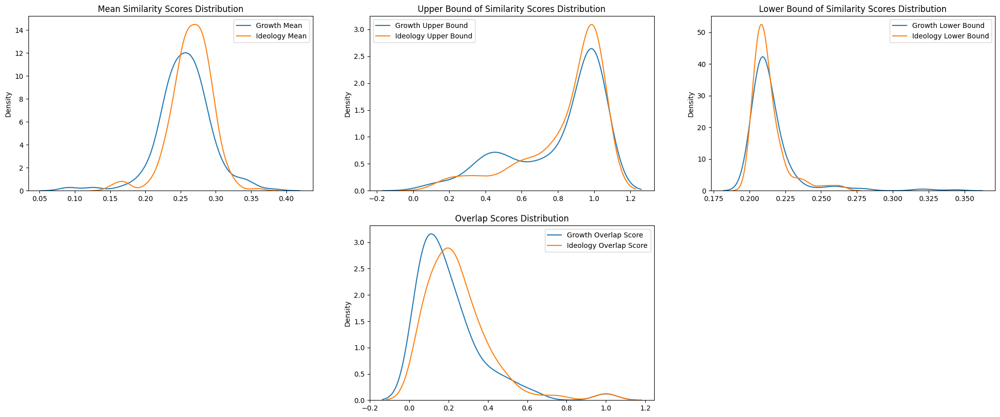

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(231)
plt.title('Mean Similarity Scores Distribution')
sns.kdeplot(weekly_df1['growth_sim_score_avg'].values)
sns.kdeplot(weekly_df1['ideology_sim_score_avg'].values)
plt.legend(['Growth Mean','Ideology Mean'])
plt.subplot(232)
plt.title('Upper Bound of Similarity Scores Distribution')
sns.kdeplot(weekly_df1['growth_sim_score'].values)
sns.kdeplot(weekly_df1['ideology_sim_score'].values)
plt.legend(['Growth Upper Bound','Ideology Upper Bound'])
plt.subplot(233)
plt.title('Lower Bound of Similarity Scores Distribution')
sns.kdeplot(weekly_df1['growth_sim_score_lower'].values)
sns.kdeplot(weekly_df1['ideology_sim_score_lower'].values)
plt.legend(['Growth Lower Bound','Ideology Lower Bound'])
plt.subplot(235)
plt.title('Overlap Scores Distribution')
sns.kdeplot(weekly_df1['growth_sim_overlap'].values)
sns.kdeplot(weekly_df1['ideology_sim_overlap'].values)
plt.legend(['Growth Overlap Score','Ideology Overlap Score'])

In [ ]:
weekly_df1[weekly_df1['growth_sim_score']==weekly_df1['ideology_sim_score']]

,index,Unnamed: 0,week_no,start_date,end_date,date_range,day_no_range,text,tidy_details,tidy_details_no_stop,...,Upper_score_Aim,growth_sim_score_lower,ideology_sim_score_lower,Lower_score_Aim,growth_sim_score_avg,ideology_sim_score_avg,mean_sim_score_Aim,growth_sim_overlap,ideology_sim_overlap,overlap_sim_Aim
15,15,15,16,2019-09-30,2019-10-06,2019-09-30 to 2019-10-06,52 to 56,Let’s talk about the POWER OF PRAISE!!!! \n\n_...,the power of praise this isn’t something we on...,power praise isn’t something practice sunday m...,...,-1,0.205375,0.209545,0,0.275636,0.254267,1,0.173913,0.235294,0
24,24,24,25,2019-12-02,2019-12-08,2019-12-02 to 2019-12-08,92 to 97,“Each one of us is looking for purpose in this...,us is looking for purpose in this life…and we ...,us looking purpose life…and grand one jesus pl...,...,-1,0.206865,0.203656,1,0.275237,0.262280,1,0.652174,0.235294,1
26,26,26,27,2019-12-16,2019-12-22,2019-12-16 to 2019-12-22,104 to 107,"“Come, let us bow down in worship, let us knee...",bow down in worship let us kneel before the lo...,bow worship let us kneel lord maker god people...,...,-1,0.207483,0.206265,1,0.243640,0.261193,0,0.217391,0.235294,0
30,30,30,31,2020-01-13,2020-01-19,2020-01-13 to 2020-01-19,118 to 122,“Church gives us the privilege of loving broke...,the privilege of loving broken and messy peopl...,privilege loving broken messy people” brady bo...,...,-1,0.215927,0.226882,0,0.264581,0.273195,0,0.173913,0.235294,0
35,35,35,36,2020-02-17,2020-02-23,2020-02-17 to 2020-02-23,137 to 140,"For the past two days, New Life Church has bee...",two days new life church has been filled with ...,two days new life church filled pastors across...,...,-1,0.206616,0.211876,0,0.314810,0.292549,1,0.173913,0.294118,0
37,37,37,38,2020-03-02,2020-03-08,2020-03-02 to 2020-03-08,145 to 149,"Starting THIS Sunday, we will begin our new se...",we will begin our new series faith in the wild...,begin new series faith wilderness learn cultiv...,...,-1,0.206177,0.205345,1,0.281163,0.297077,0,0.217391,0.470588,0
40,40,40,41,2020-03-23,2020-03-29,2020-03-23 to 2020-03-29,161 to 167,“The Lord’s Table is where we REMEMBER what is...,is where we remember what is true and forget w...,remember true forget false”did miss message pa...,...,-1,0.205045,0.202687,1,0.240669,0.275697,0,0.217391,0.764706,0
76,76,76,77,2020-11-30,2020-12-06,2020-11-30 to 2020-12-06,338 to 342,"“It’s about God is Provider, because that is H...",is provider because that is his nature it is w...,provider nature dependent upon human condition...,...,-1,0.208860,0.213272,0,0.277342,0.291957,0,0.173913,0.352941,0
79,79,79,80,2020-12-21,2020-12-27,2020-12-21 to 2020-12-27,350 to 354,"New Life family, can you believe we are only a...",can you believe we are only a few days away fr...,believe days away christmas favorite christmas...,...,-1,0.201028,0.204816,0,0.240334,0.295854,0,0.260870,0.764706,0
81,81,81,82,2021-01-04,2021-01-10,2021-01-04 to 2021-01-10,358 to 363,"as if the new year couldn’t get any better, FI...",new year couldn’t get any better first wednesd...,new year couldn’t get better first wednesday b...,...,-1,0.214164,0.201383,1,0.248697,0.293627,0,0.260870,0.411765,0


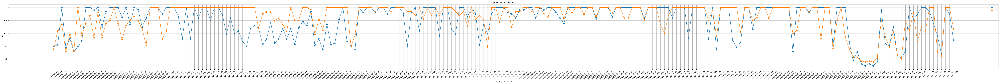

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df1['start_date']
score1 = weekly_df1['growth_sim_score']
score2 = weekly_df1['ideology_sim_score']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Upper Bound Scores')
plt.xticks(weekly_df1['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Upper Bound Score.png")
plt.show()



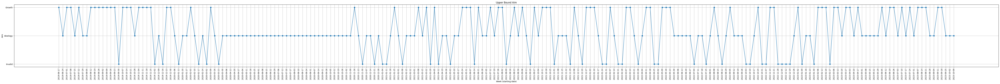

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(70, 6))
plt.plot(weekly_df1['start_date'], weekly_df1['Upper_score_Aim'], marker='o', linestyle='-')
plt.title('Upper Bound Aim')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(weekly_df1['start_date'],rotation=90)
plt.yticks()
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Upper Bound Aim.png")
plt.show()

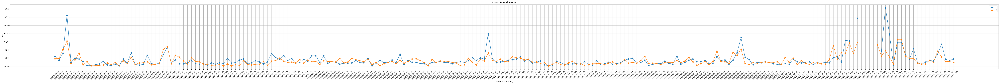

In [ ]:

plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df1['start_date']
score1 = weekly_df1['growth_sim_score_lower']
score2 = weekly_df1['ideology_sim_score_lower']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Lower Bound Scores')
plt.xticks(weekly_df1['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Lower Bound Score.png")
plt.show()


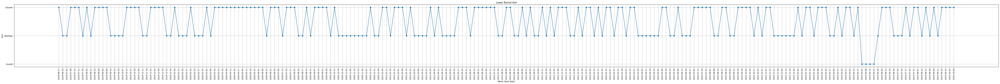

In [ ]:

plt.figure(figsize=(70, 6))
plt.plot(weekly_df1['start_date'], weekly_df1['Lower_score_Aim'], marker='o', linestyle='-')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.title('Lower Bound Aim')
plt.xticks(weekly_df1['start_date'],rotation=90)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Lower Bound Aim.png")
plt.show()

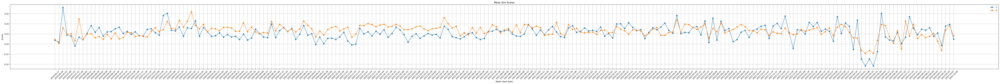

In [ ]:

plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df1['start_date']
score1 = weekly_df1['growth_sim_score_avg']
score2 = weekly_df1['ideology_sim_score_avg']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Mean Sim Scores')
plt.xticks(weekly_df1['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Mean Sim Score.png")
plt.show()


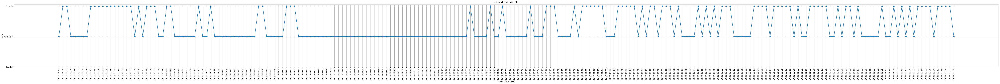

In [ ]:
plt.figure(figsize=(70, 6))
plt.plot(weekly_df1['start_date'], weekly_df1['mean_sim_score_Aim'], marker='o', linestyle='-')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.title('Mean Sim Scores Aim')
plt.xticks(weekly_df1['start_date'],rotation=90)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Mean Sim Score Aim.png")
plt.show()

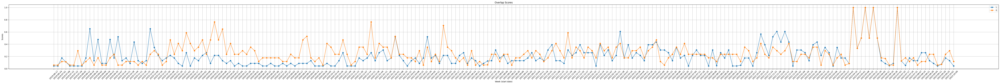

In [ ]:

plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df1['start_date']
score1 = weekly_df1['growth_sim_overlap']
score2 = weekly_df1['ideology_sim_overlap']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Overlap Scores')
plt.xticks(weekly_df1['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Overlap Score.png")

plt.show()


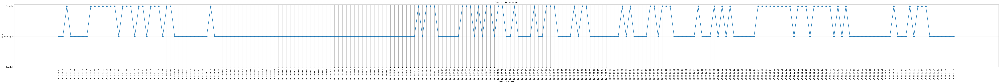

In [ ]:
plt.figure(figsize=(70, 6))
plt.plot(weekly_df1['start_date'], weekly_df1['overlap_sim_Aim'], marker='o', linestyle='-')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.title('Overlap Score Aims')
plt.xticks(weekly_df1['start_date'],rotation=90)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Overlap Score Aim.png")

plt.show()

In [ ]:
def update_overlap_4(row):
    if all(value == 1 for value in row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']]):
        return 1
    elif all(value == 0 for value in row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']]):
        return 0
    else:
        return pd.NA

In [ ]:
def update_overlap_3(row):
    if row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']].eq(1).sum() == 3:
        return 1
    elif row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']].eq(0).sum() == 3:
        return 0
    else:
        return pd.NA

In [ ]:
def update_overlap_2(row):
    if(max(abs(row['growth_sim_score']-row['ideology_sim_score']),abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower']),abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg']),abs(row['growth_sim_overlap']-row['ideology_sim_overlap']))==abs(row['growth_sim_score']-row['ideology_sim_score'])):
        return row['Upper_score_Aim']
    elif(max(abs(row['growth_sim_score']-row['ideology_sim_score']),abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower']),abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg']),abs(row['growth_sim_overlap']-row['ideology_sim_overlap']))==abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower'])):
        return row['Lower_score_Aim']
    elif(max(abs(row['growth_sim_score']-row['ideology_sim_score']),abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower']),abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg']),abs(row['growth_sim_overlap']-row['ideology_sim_overlap']))==abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg'])):
        return row['mean_sim_score_Aim']
    else:
        return row['overlap_sim_Aim']

In [ ]:

d=weekly_df1.drop(['tidy_details','tidy_details_no_stop','lem_tidy_details_no_stop'],axis=1)
d['4_overlap_aim']=np.nan
d['3_overlap_aim']=np.nan

d['4_overlap_aim'] = d.apply(update_overlap_4, axis=1)
d['3_overlap_aim'] = d.apply(update_overlap_3, axis=1)

overlap_4 = d.drop(['growth_sim_score','ideology_sim_score','growth_sim_score_lower','ideology_sim_score_lower','growth_sim_score_avg','ideology_sim_score_avg','growth_sim_overlap','ideology_sim_overlap'],axis=1).dropna(subset=['4_overlap_aim'])
overlap_3 = d.drop(['growth_sim_score','ideology_sim_score','growth_sim_score_lower','ideology_sim_score_lower','growth_sim_score_avg','ideology_sim_score_avg','growth_sim_overlap','ideology_sim_overlap'],axis=1).dropna(subset=['3_overlap_aim'])
    #overlap_4.to_csv(path+"/overlap_4.csv")
    #overlap_3.to_csv(path+"/overlap_3.csv")


d['2_overlap_aim']=np.nan

overlap_2=d[(d["3_overlap_aim"].isna())&(d["4_overlap_aim"].isna())]

overlap_2=overlap_2.drop(columns=['4_overlap_aim','3_overlap_aim'])
overlap_2['2_overlap_aim'] = d.apply(update_overlap_2, axis=1)
    #overlap_2.to_csv(path+"/overlap_2.csv")


ov2=overlap_2.drop(columns=['growth_sim_score','ideology_sim_score','growth_sim_score_lower','ideology_sim_score_lower','growth_sim_score_avg','ideology_sim_score_avg','growth_sim_overlap','ideology_sim_overlap'])
overlap_4.rename(columns = {'4_overlap_aim':'AIM'}, inplace = True)
ov2.rename(columns = {'2_overlap_aim':'AIM'}, inplace = True)
overlap_3.rename(columns = {'3_overlap_aim':'AIM'}, inplace = True)
overlap_43_1=pd.concat([overlap_3,overlap_4])
overlap_43_1=overlap_43_1.sort_index()
overlap_43_1.drop(columns=['4_overlap_aim','3_overlap_aim'], inplace=True)
final1=pd.concat([overlap_3,overlap_4,ov2])

final1=final1.sort_index()
final1.drop(columns=['4_overlap_aim','3_overlap_aim'], inplace=True)
overlap_43_1.to_csv("weekly/Final_Aim_34_ov.csv")

final1.to_csv("weekly/final.csv")


In [ ]:
print("percentage of posts with overlap of 4 =",100*len(overlap_4)/len(weekly_df1),"%")
print("percentage of posts with overlap of 3 =",100*len(overlap_3)/len(weekly_df1),"%")
print("percentage of posts with overlap of 2 =",100*len(overlap_2)/len(weekly_df1),"%")

percentage of posts with overlap of 4 = 28.0 %
percentage of posts with overlap of 3 = 42.22222222222222 %
percentage of posts with overlap of 2 = 29.77777777777778 %


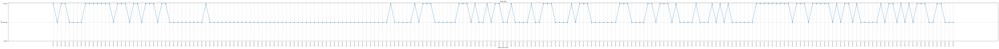

In [ ]:
plt.figure(figsize=(120, 6))
plt.plot(final1['start_date'], final1['AIM'], marker='o', linestyle='-')
plt.title('Final Aim')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.xticks(weekly_df1['start_date'],rotation=90,fontsize=7)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("weekly/Final.png")
plt.show()

In [ ]:
word2vec_final=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly/new_model/Final_Aim.csv")
weekly_df2=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly/new_model/all_methods_aim_weekly.csv")
overlap_43_2=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly/new_model/Final_Aim_34_ov.csv")
weekly_df1['start_date'] = pd.to_datetime(weekly_df1['start_date'])
overlap_43_2['start_date'] = pd.to_datetime(overlap_43_2['start_date'])
overlap_43_1['start_date'] = pd.to_datetime(overlap_43_1['start_date'])
final1['start_date'] = pd.to_datetime(final1['start_date'])
weekly_df2['start_date'] = pd.to_datetime(weekly_df2['start_date'])
word2vec_final['start_date'] = pd.to_datetime(word2vec_final['start_date'])


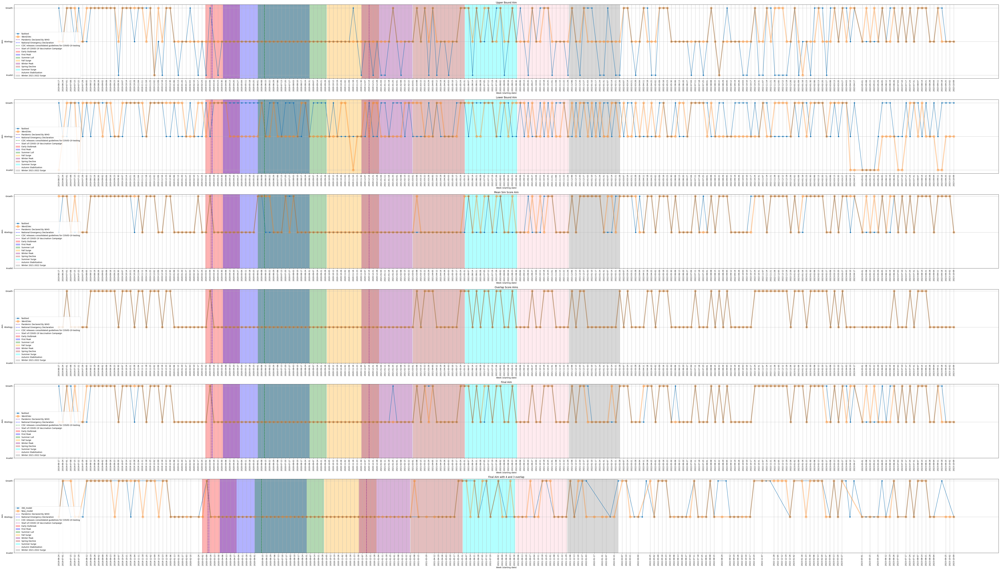

In [ ]:
from datetime import datetime
plt.figure(figsize=(70,40))
periods = {
    'Pandemic Declared By WHO': pd.to_datetime('2020-03-11'),
    'National Emergency Declaration': pd.to_datetime('2020-03-13'),
    'CDC releases consolidated guidelines for COVID-19 testing': pd.to_datetime('2020-06-13'),
    'Start of COVID-19 Vaccination Campaign': pd.to_datetime('2020-12-14'),
}
# Define colors for specific periods
color_dict = {
    'Pandemic Declared By WHO':'Indigo',
    'National Emergency Declaration': 'blue',
    'CDC releases consolidated guidelines for COVID-19 testing': 'green',
    'Start of COVID-19 Vaccination Campaign': 'purple',
}

plt.subplot(611)
plt.plot(weekly_df1['start_date'], weekly_df1['Upper_score_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['Upper_score_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)

plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Upper Bound Aim')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(612)
plt.plot(weekly_df1['start_date'], weekly_df1['Lower_score_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['Lower_score_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Lower Bound Aim')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)


plt.subplot(613)
plt.plot(weekly_df1['start_date'], weekly_df1['mean_sim_score_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['mean_sim_score_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Mean Sim Score Aim')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(614)
plt.plot(weekly_df1['start_date'], weekly_df1['overlap_sim_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['overlap_sim_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Overlap Score Aims')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(615)
plt.plot(final1['start_date'], final1['AIM'], marker='o',label='fasttext', linestyle='-')
plt.plot(word2vec_final['start_date'], word2vec_final['AIM'], marker='o',label='Word2Vec', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.title('Final Aim')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(word2vec_final['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(616)
plt.plot(overlap_43_1['start_date'], overlap_43_1['AIM'], marker='o',label='Old_model', linestyle='-')
plt.plot(overlap_43_2['start_date'], overlap_43_2['AIM'], marker='o',label='New_model', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.title('Final Aim with 4 and 3 overlap')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(overlap_43_2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.tight_layout()

plt.savefig("weekly_graph.png")
plt.show()


Default Parameters Model

In [ ]:
weekly_df3=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly 15. Less Than 250.csv")

In [ ]:
from gensim.models import FastText

# Load the saved FastText model
model = FastText.load("fasttext_post_Classification2")

# Access the vocabulary
vocab = model.wv.key_to_index

In [ ]:
iw = ['devoted', 'parish', 'service', 'tradition', 'gospel', 'liturgy', 'anglican', 'teaching', 'worship', 'glorify_god', 'spiritual', 'open_hearts', 'bible_believing', 'great_commission', 'help', 'inspired_word', 'one_another', 'transformation_world', 'old_new_testament', 'educate']
ideology_words=[]
for i in iw:
    if i in vocab:
        ideology_words.append(i)
    else:
        print(i)

glorify_god
bible_believing
inspired_word
transformation_world


In [ ]:
gw = ['community', 'family', 'congregation', 'join', 'invite', 'reach', 'diversity', 'grow', 'come', 'welcome', 'friendly', 'bring', 'newcomers', 'meet', 'connect', 'volunteers', 'evangelical', 'cultural', 'making_disciples', 'unity', 'missionaries', 'committed_helping', 'christian_fellowship', 'spiritual_growth']
growth_words=[]
for i in gw:
    if i in vocab:
        growth_words.append(i)
    else:
        print(i)

committed_helping
christian_fellowship


In [ ]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations


In [ ]:
growth_vectors=[model.wv[word] for word in growth_words if word in vocab]
ideology_vectors=[model.wv[word] for word in ideology_words if word in vocab]


weekly_df3['growth_sim_score'] = 0.0
weekly_df3['ideology_sim_score'] = 0.0
weekly_df3['Upper_score_Aim'] = 'NaN'

weekly_df3['growth_sim_score_lower'] = 0.0
weekly_df3['ideology_sim_score_lower'] = 0.0
weekly_df3['Lower_score_Aim'] = 'NaN'

weekly_df3['growth_sim_score_avg'] = 0.0
weekly_df3['ideology_sim_score_avg'] = 0.0
weekly_df3['mean_sim_score_Aim'] = 'NaN'

weekly_df3['growth_sim_overlap'] = 0.0
weekly_df3['ideology_sim_overlap'] = 0.0
weekly_df3['overlap_sim_Aim']='NaN'

growth_len = len(growth_words)
ideology_len = len(ideology_words)

weekly_df3=weekly_df3.reset_index()

In [ ]:
for index, row in weekly_df3.iterrows():
    detail=list(sent_to_words(weekly_df3['tidy_details_no_stop']))[index]
    sent = [word for word in detail if word in vocab]

    if len(sent)>0:
        word_vectors = [model.wv[word] for word in sent]
        cos_sims_growth = np.max(cosine_similarity(word_vectors, growth_vectors), axis=1)
        cos_sims_ideology = np.max(cosine_similarity(word_vectors, ideology_vectors), axis=1)

        cos_sims_growth.sort()
        cos_sims_ideology.sort()

        mean_sim_growth, mean_sim_ideology = cos_sims_growth[-3:].mean(), cos_sims_ideology[-3:].mean()
        weekly_df3['growth_sim_score'][index], weekly_df3['ideology_sim_score'][index] = mean_sim_growth, mean_sim_ideology
        weekly_df3['Upper_score_Aim'][index] = 1 if mean_sim_growth>mean_sim_ideology else 0
        if mean_sim_growth==mean_sim_ideology:
            weekly_df3['Upper_score_Aim'][index] = -1

        mean_sim_growth = cos_sims_growth[np.where(cos_sims_growth > 0.2)][:6].mean()
        mean_sim_ideology = cos_sims_ideology[np.where(cos_sims_ideology > 0.2)][:6].mean()
        weekly_df3.at[index, 'growth_sim_score_lower'] = mean_sim_growth
        weekly_df3.at[index, 'ideology_sim_score_lower'] = mean_sim_ideology
        weekly_df3['Lower_score_Aim'][index] = 1 if mean_sim_growth>mean_sim_ideology else 0
        if (mean_sim_growth==mean_sim_ideology or (pd.isna(mean_sim_growth) & pd.isna(mean_sim_ideology))):
            weekly_df3['Lower_score_Aim'][index] = -1

        mean_sim_growth, mean_sim_ideology = cos_sims_growth.mean(), cos_sims_ideology.mean()
        weekly_df3['growth_sim_score_avg'][index], weekly_df3['ideology_sim_score_avg'][index] = mean_sim_growth, mean_sim_ideology
        weekly_df3['mean_sim_score_Aim'][index] = 1 if mean_sim_growth>mean_sim_ideology else 0

(weekly_df3.drop(['growth_sim_overlap','ideology_sim_overlap','overlap_sim_Aim','growth_sim_score_lower','ideology_sim_score_lower','Lower_score_Aim','growth_sim_score_avg','ideology_sim_score_avg','mean_sim_score_Aim'],axis=1)).to_csv("default_parameters_model/weekly/Upper_score_aim_weekly.csv")
(weekly_df3.drop(['growth_sim_score','ideology_sim_score','Upper_score_Aim','growth_sim_overlap','ideology_sim_overlap','overlap_sim_Aim','growth_sim_score_avg','ideology_sim_score_avg','mean_sim_score_Aim'],axis=1)).to_csv("default_parameters_model/weekly/Lower_score_ai_weekly.csv")
(weekly_df3.drop(['growth_sim_score','ideology_sim_score','Upper_score_Aim','growth_sim_score_lower','ideology_sim_score_lower','Lower_score_Aim','growth_sim_overlap','ideology_sim_overlap','overlap_sim_Aim'],axis=1)).to_csv("default_parameters_model/weekly/mean_sim_score_aim_weekly.csv")


In [ ]:
for index, row in weekly_df3.iterrows():
    detail=list(sent_to_words(weekly_df3['tidy_details_no_stop']))[index]
    growth_overlap, ideology_overlap = 0, 0
    sent = []
    for word in detail:
        if word in growth_words:
            growth_overlap+=1
        elif word in ideology_words:
            ideology_overlap+=1
        else:
            sent.append(word)
    sent = [word for word in sent if word in vocab]
    if len(sent)>0:
        word_vectors = [model.wv[word] for word in sent]
        cos_sims_growth = np.max(cosine_similarity(word_vectors, growth_vectors), axis=1)
        cos_sims_ideology = np.max(cosine_similarity(word_vectors, ideology_vectors), axis=1)
        growth_overlap+= len(np.where(cos_sims_growth>0.7))
        ideology_overlap+=len(np.where(cos_sims_ideology>0.7))

    Dr_g, Dr_i = min(len(detail), len(np.where(cos_sims_growth>0.7))+growth_len), min(len(detail), len(np.where(cos_sims_ideology>0.7))+ideology_len)
    if Dr_g!=0:
        weekly_df3['growth_sim_overlap'][index] = growth_overlap/Dr_g
    else:
        weekly_df3['growth_sim_overlap'][index]=-1
    if Dr_i!=0:
        weekly_df3['ideology_sim_overlap'][index]=ideology_overlap/Dr_i
    else:
        weekly_df3['ideology_sim_overlap'][index]=-1
    weekly_df3['overlap_sim_Aim'][index] = 1 if weekly_df3['growth_sim_overlap'][index]>weekly_df3['ideology_sim_overlap'][index] else 0
    if (weekly_df3['growth_sim_overlap'][index]==-1 and weekly_df3['ideology_sim_overlap'][index]==-1):
        weekly_df3['overlap_sim_Aim'][index] = -1

(weekly_df3.drop(['growth_sim_score','ideology_sim_score','Upper_score_Aim','growth_sim_score_lower','ideology_sim_score_lower','Lower_score_Aim','growth_sim_score_avg','ideology_sim_score_avg','mean_sim_score_Aim'],axis=1)).to_csv("default_parameters_model/weekly/overlap_sim_score_aim_weekly.csv")

weekly_df3.to_csv("default_parameters_model/weekly/all_methods_aim_weekly.csv")

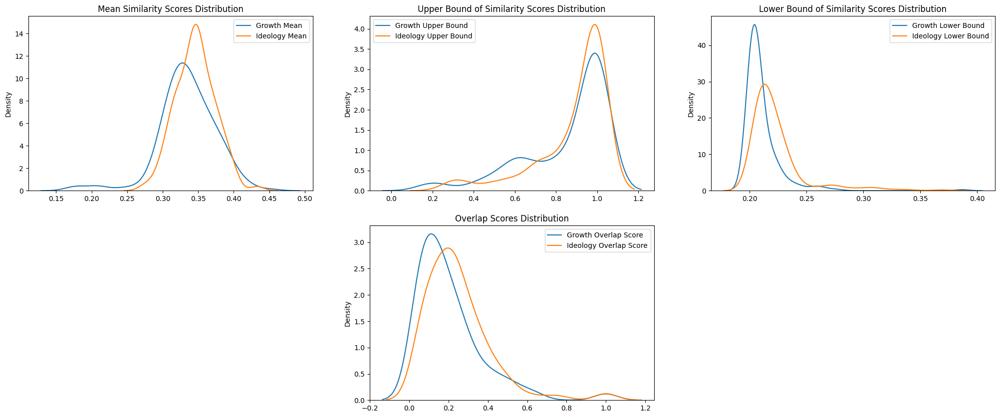

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(231)
plt.title('Mean Similarity Scores Distribution')
sns.kdeplot(weekly_df3['growth_sim_score_avg'].values)
sns.kdeplot(weekly_df3['ideology_sim_score_avg'].values)
plt.legend(['Growth Mean','Ideology Mean'])
plt.subplot(232)
plt.title('Upper Bound of Similarity Scores Distribution')
sns.kdeplot(weekly_df3['growth_sim_score'].values)
sns.kdeplot(weekly_df3['ideology_sim_score'].values)
plt.legend(['Growth Upper Bound','Ideology Upper Bound'])
plt.subplot(233)
plt.title('Lower Bound of Similarity Scores Distribution')
sns.kdeplot(weekly_df3['growth_sim_score_lower'].values)
sns.kdeplot(weekly_df3['ideology_sim_score_lower'].values)
plt.legend(['Growth Lower Bound','Ideology Lower Bound'])
plt.subplot(235)
plt.title('Overlap Scores Distribution')
sns.kdeplot(weekly_df3['growth_sim_overlap'].values)
sns.kdeplot(weekly_df3['ideology_sim_overlap'].values)
plt.legend(['Growth Overlap Score','Ideology Overlap Score'])

In [ ]:
weekly_df3[weekly_df3['growth_sim_score']==weekly_df3['ideology_sim_score']]

,index,Unnamed: 0,week_no,start_date,end_date,date_range,day_no_range,text,tidy_details,tidy_details_no_stop,...,Upper_score_Aim,growth_sim_score_lower,ideology_sim_score_lower,Lower_score_Aim,growth_sim_score_avg,ideology_sim_score_avg,mean_sim_score_Aim,growth_sim_overlap,ideology_sim_overlap,overlap_sim_Aim
33,33,33,34,2020-02-03,2020-02-09,2020-02-03 to 2020-02-09,130 to 134,Something really special happened yesterday 😊\...,happened yesterday newlifeeast officially laun...,happened yesterday newlifeeast officially laun...,...,-1,0.202459,0.220734,0,0.343335,0.386619,0,0.260870,0.588235,0
85,85,85,86,2021-02-01,2021-02-07,2021-02-01 to 2021-02-07,377 to 382,Did you know we are partnered with Asbury Theo...,we are partnered with asbury theological semin...,partnered asbury theological seminaryon februa...,...,-1,0.201418,0.207151,0,0.356428,0.344092,1,0.521739,0.529412,0
98,98,98,99,2021-05-03,2021-05-09,2021-05-03 to 2021-05-09,446 to 450,FIRST WEDNESDAY is tomorrow night! 🔥 Make sure...,tomorrow night make sure to join us at mt for...,tomorrow night make sure join us mt favorite n...,...,-1,0.208299,0.206963,1,0.333009,0.337679,0,0.217391,0.352941,0
118,118,118,119,2021-09-20,2021-09-26,2021-09-20 to 2021-09-26,518 to 520,"Want to learn more about how you can worship, ...",more about how you can worship connect and ser...,worship connect serve new life church join us ...,...,-1,0.210899,0.232886,0,0.377436,0.369387,1,0.173913,0.294118,0
128,128,128,129,2021-11-29,2021-12-05,2021-11-29 to 2021-12-05,567 to 573,"Only ONE more month left in 2021, let’s finish...",month left in let’s finish strong let’s worsh...,month left let’s finish strong let’s worship p...,...,-1,0.209069,0.211467,0,0.347266,0.374338,0,0.304348,0.588235,0
137,137,137,138,2022-01-31,2022-02-06,2022-01-31 to 2022-02-06,617 to 622,“God cannot be worn down by our waywardness. T...,worn down by our waywardness this is the god w...,worn waywardness god keeps coming us mercy” pa...,...,-1,0.201381,0.206126,0,0.307641,0.331172,0,0.217391,0.294118,0
138,138,138,139,2022-02-07,2022-02-13,2022-02-07 to 2022-02-13,623 to 627,We are sad Sunday is over but we enjoyed seein...,sunday is over but we enjoyed seeing all of yo...,sunday enjoyed seeing missed yesterday’s messa...,...,-1,0.201466,0.209321,0,0.331100,0.334883,0,0.304348,0.352941,0
144,144,144,145,2022-03-21,2022-03-27,2022-03-21 to 2022-03-27,652 to 655,Thanks for joining us for Care Sunday!! 🙌\n\nI...,us for care sunday if you or a loved one is in...,us care sunday loved one need support year ple...,...,-1,0.201596,0.220016,0,0.382590,0.333285,1,0.173913,0.294118,0
148,148,148,149,2022-04-18,2022-04-24,2022-04-18 to 2022-04-24,670 to 675,Monday prayer is canceled due to the building ...,canceled due to the building being closed pray...,canceled due building closed prayer resume tue...,...,-1,0.201187,0.205826,0,0.327384,0.314109,1,0.391304,0.294118,1
156,156,156,157,2022-06-13,2022-06-19,2022-06-13 to 2022-06-19,716 to 721,Why can we put our faith in God? ✨\n\n1. Becau...,put our faith in god because he cares about y...,put faith god cares found constant watch full ...,...,-1,0.203135,0.202291,1,0.320834,0.340634,0,0.173913,0.235294,0


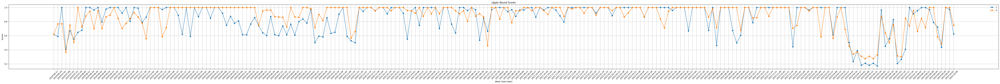

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df3['start_date']
score1 = weekly_df3['growth_sim_score']
score2 = weekly_df3['ideology_sim_score']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Upper Bound Scores')
plt.xticks(weekly_df3['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Upper Bound Score.png")
plt.show()



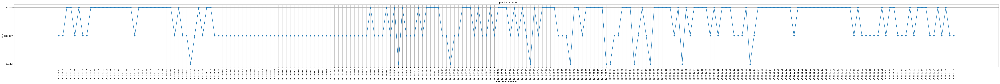

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(70, 6))
plt.plot(weekly_df3['start_date'], weekly_df3['Upper_score_Aim'], marker='o', linestyle='-')
plt.title('Upper Bound Aim')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(weekly_df3['start_date'],rotation=90)
plt.yticks()
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Upper Bound Aim.png")
plt.show()

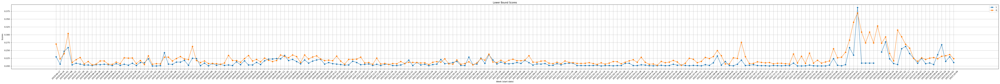

In [ ]:

plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df3['start_date']
score1 = weekly_df3['growth_sim_score_lower']
score2 = weekly_df3['ideology_sim_score_lower']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Lower Bound Scores')
plt.xticks(weekly_df3['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Lower Bound Score.png")
plt.show()


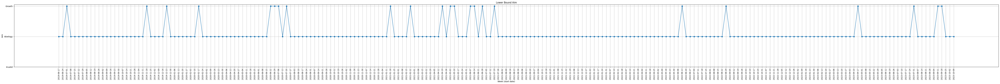

In [ ]:

plt.figure(figsize=(70, 6))
plt.plot(weekly_df3['start_date'], weekly_df3['Lower_score_Aim'], marker='o', linestyle='-')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.title('Lower Bound Aim')
plt.xticks(weekly_df3['start_date'],rotation=90)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Lower Bound Aim.png")
plt.show()

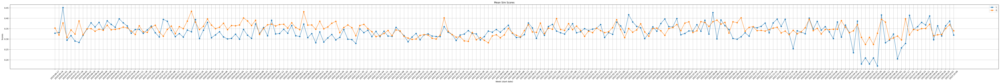

In [ ]:

plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df3['start_date']
score1 = weekly_df3['growth_sim_score_avg']
score2 = weekly_df3['ideology_sim_score_avg']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Mean Sim Scores')
plt.xticks(weekly_df3['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Mean Sim Score.png")
plt.show()


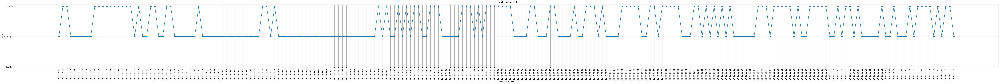

In [ ]:
plt.figure(figsize=(70, 6))
plt.plot(weekly_df3['start_date'], weekly_df3['mean_sim_score_Aim'], marker='o', linestyle='-')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.title('Mean Sim Scores Aim')
plt.xticks(weekly_df3['start_date'],rotation=90)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Mean Sim Score Aim.png")
plt.show()

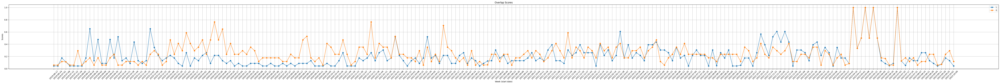

In [ ]:

plt.figure(figsize=(70, 6))
# Assuming df is your DataFrame with columns 'date', 'score1', and 'score2'
dates = weekly_df3['start_date']
score1 = weekly_df3['growth_sim_overlap']
score2 = weekly_df3['ideology_sim_overlap']

# Plot the graph
plt.plot(dates, score1, label=1, marker='o', linestyle='-')
plt.plot(dates, score2, label=0, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Week (start date)')
plt.ylabel('Scores')
plt.title('Overlap Scores')
plt.xticks(weekly_df3['start_date'],rotation=90)

# Add legend
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the plot
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Overlap Score.png")

plt.show()


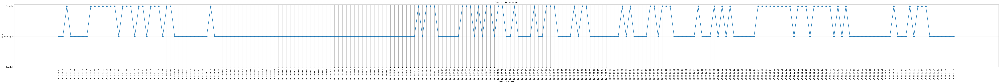

In [ ]:
plt.figure(figsize=(70, 6))
plt.plot(weekly_df3['start_date'], weekly_df3['overlap_sim_Aim'], marker='o', linestyle='-')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.title('Overlap Score Aims')
plt.xticks(weekly_df3['start_date'],rotation=90)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Overlap Score Aim.png")

plt.show()

In [ ]:
def update_overlap_4(row):
    if all(value == 1 for value in row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']]):
        return 1
    elif all(value == 0 for value in row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']]):
        return 0
    else:
        return pd.NA

In [ ]:
def update_overlap_3(row):
    if row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']].eq(1).sum() == 3:
        return 1
    elif row[['Upper_score_Aim','Lower_score_Aim' , 'mean_sim_score_Aim', 'overlap_sim_Aim']].eq(0).sum() == 3:
        return 0
    else:
        return pd.NA

In [ ]:
def update_overlap_2(row):
    if(max(abs(row['growth_sim_score']-row['ideology_sim_score']),abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower']),abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg']),abs(row['growth_sim_overlap']-row['ideology_sim_overlap']))==abs(row['growth_sim_score']-row['ideology_sim_score'])):
        return row['Upper_score_Aim']
    elif(max(abs(row['growth_sim_score']-row['ideology_sim_score']),abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower']),abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg']),abs(row['growth_sim_overlap']-row['ideology_sim_overlap']))==abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower'])):
        return row['Lower_score_Aim']
    elif(max(abs(row['growth_sim_score']-row['ideology_sim_score']),abs(row['ideology_sim_score_lower']-row['growth_sim_score_lower']),abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg']),abs(row['growth_sim_overlap']-row['ideology_sim_overlap']))==abs(row['growth_sim_score_avg']-row['ideology_sim_score_avg'])):
        return row['mean_sim_score_Aim']
    else:
        return row['overlap_sim_Aim']

In [ ]:

d=weekly_df3.drop(['tidy_details','tidy_details_no_stop','lem_tidy_details_no_stop'],axis=1)
d['4_overlap_aim']=np.nan
d['3_overlap_aim']=np.nan

d['4_overlap_aim'] = d.apply(update_overlap_4, axis=1)
d['3_overlap_aim'] = d.apply(update_overlap_3, axis=1)

overlap_4 = d.drop(['growth_sim_score','ideology_sim_score','growth_sim_score_lower','ideology_sim_score_lower','growth_sim_score_avg','ideology_sim_score_avg','growth_sim_overlap','ideology_sim_overlap'],axis=1).dropna(subset=['4_overlap_aim'])
overlap_3 = d.drop(['growth_sim_score','ideology_sim_score','growth_sim_score_lower','ideology_sim_score_lower','growth_sim_score_avg','ideology_sim_score_avg','growth_sim_overlap','ideology_sim_overlap'],axis=1).dropna(subset=['3_overlap_aim'])
    #overlap_4.to_csv(path+"/overlap_4.csv")
    #overlap_3.to_csv(path+"/overlap_3.csv")


d['2_overlap_aim']=np.nan

overlap_2=d[(d["3_overlap_aim"].isna())&(d["4_overlap_aim"].isna())]

overlap_2=overlap_2.drop(columns=['4_overlap_aim','3_overlap_aim'])
overlap_2['2_overlap_aim'] = d.apply(update_overlap_2, axis=1)
    #overlap_2.to_csv(path+"/overlap_2.csv")


ov2=overlap_2.drop(columns=['growth_sim_score','ideology_sim_score','growth_sim_score_lower','ideology_sim_score_lower','growth_sim_score_avg','ideology_sim_score_avg','growth_sim_overlap','ideology_sim_overlap'])
overlap_4.rename(columns = {'4_overlap_aim':'AIM'}, inplace = True)
ov2.rename(columns = {'2_overlap_aim':'AIM'}, inplace = True)
overlap_3.rename(columns = {'3_overlap_aim':'AIM'}, inplace = True)
overlap_43_3=pd.concat([overlap_3,overlap_4])
overlap_43_3=overlap_43_3.sort_index()
overlap_43_3.drop(columns=['4_overlap_aim','3_overlap_aim'], inplace=True)
final3=pd.concat([overlap_3,overlap_4,ov2])

final3=final3.sort_index()
final3.drop(columns=['4_overlap_aim','3_overlap_aim'], inplace=True)

final3.to_csv("default_parameters_model/weekly/final.csv")


In [ ]:
print("percentage of posts with overlap of 4 =",100*len(overlap_4)/len(weekly_df3),"%")
print("percentage of posts with overlap of 3 =",100*len(overlap_3)/len(weekly_df3),"%")
print("percentage of posts with overlap of 2 =",100*len(overlap_2)/len(weekly_df3),"%")

percentage of posts with overlap of 4 = 35.55555555555556 %
percentage of posts with overlap of 3 = 48.0 %
percentage of posts with overlap of 2 = 16.444444444444443 %


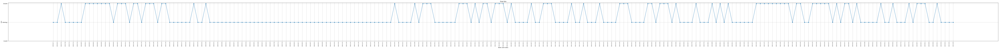

In [ ]:
plt.figure(figsize=(120, 6))
plt.plot(final3['start_date'], final3['AIM'], marker='o', linestyle='-')
plt.title('Final Aim')
plt.xlabel('Week (start date)')
plt.ylabel('Aim')
plt.xticks(weekly_df3['start_date'],rotation=90,fontsize=7)
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)
plt.tight_layout()
plt.savefig("default_parameters_model/weekly/Final.png")
plt.show()

In [ ]:
word2vec_final=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly/new_model/Final_Aim.csv")
weekly_df2=pd.read_csv("/Users/khushiagrawal/Desktop/iimb/task 6/15. Less Than 250/weekly/new_model/all_methods_aim_weekly.csv")
weekly_df3['start_date'] = pd.to_datetime(weekly_df3['start_date'])
final3['start_date'] = pd.to_datetime(final3['start_date'])
weekly_df2['start_date'] = pd.to_datetime(weekly_df2['start_date'])
word2vec_final['start_date'] = pd.to_datetime(word2vec_final['start_date'])
overlap_43_3['start_date']= pd.to_datetime(overlap_43_3['start_date'])


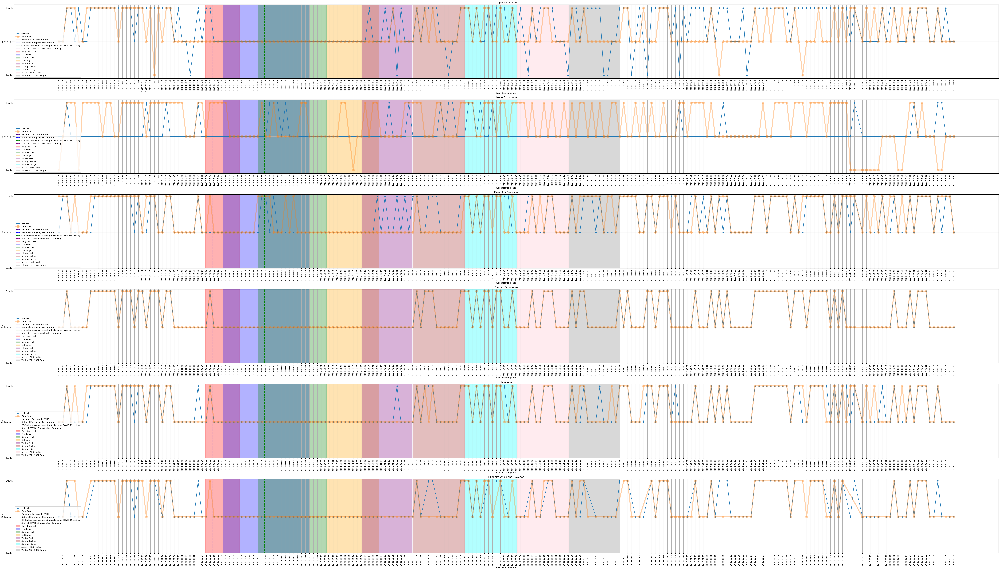

In [ ]:
from datetime import datetime
plt.figure(figsize=(70,40))
periods = {
    'Pandemic Declared By WHO': pd.to_datetime('2020-03-11'),
    'National Emergency Declaration': pd.to_datetime('2020-03-13'),
    'CDC releases consolidated guidelines for COVID-19 testing': pd.to_datetime('2020-06-13'),
    'Start of COVID-19 Vaccination Campaign': pd.to_datetime('2020-12-14'),
}
# Define colors for specific periods
color_dict = {
    'Pandemic Declared By WHO':'Indigo',
    'National Emergency Declaration': 'blue',
    'CDC releases consolidated guidelines for COVID-19 testing': 'green',
    'Start of COVID-19 Vaccination Campaign': 'purple',
}

plt.subplot(611)
plt.plot(weekly_df3['start_date'], weekly_df3['Upper_score_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['Upper_score_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)

plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Upper Bound Aim')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(612)
plt.plot(weekly_df3['start_date'], weekly_df3['Lower_score_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['Lower_score_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Lower Bound Aim')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)


plt.subplot(613)
plt.plot(weekly_df3['start_date'], weekly_df3['mean_sim_score_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['mean_sim_score_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Mean Sim Score Aim')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(614)
plt.plot(weekly_df3['start_date'], weekly_df3['overlap_sim_Aim'],label='fasttext', marker='o', linestyle='-')
plt.plot(weekly_df2['start_date'], weekly_df2['overlap_sim_Aim'],label='Word2Vec', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Overlap Score Aims')
plt.xticks(weekly_df2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(615)
plt.plot(final3['start_date'], final3['AIM'], marker='o',label='fasttext', linestyle='-')
plt.plot(word2vec_final['start_date'], word2vec_final['AIM'], marker='o',label='Word2Vec', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.title('Final Aim')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(word2vec_final['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(616)
plt.plot(overlap_43_3['start_date'], overlap_43_3['AIM'], marker='o',label='fasttext', linestyle='-')
plt.plot(overlap_43_2['start_date'], overlap_43_2['AIM'], marker='o',label='Word2vec', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.title('Final Aim with 4 and 3 overlap')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(overlap_43_2['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.tight_layout()

plt.savefig("default_parameters_model/weekly_graph.png")
plt.show()


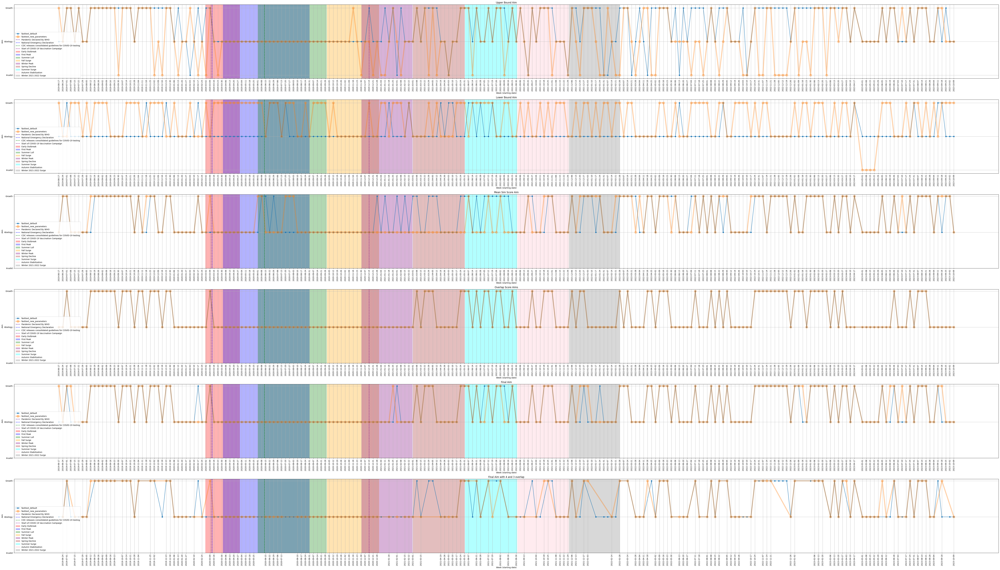

In [ ]:
from datetime import datetime
plt.figure(figsize=(70,40))
periods = {
    'Pandemic Declared By WHO': pd.to_datetime('2020-03-11'),
    'National Emergency Declaration': pd.to_datetime('2020-03-13'),
    'CDC releases consolidated guidelines for COVID-19 testing': pd.to_datetime('2020-06-13'),
    'Start of COVID-19 Vaccination Campaign': pd.to_datetime('2020-12-14'),
}
# Define colors for specific periods
color_dict = {
    'Pandemic Declared By WHO':'Indigo',
    'National Emergency Declaration': 'blue',
    'CDC releases consolidated guidelines for COVID-19 testing': 'green',
    'Start of COVID-19 Vaccination Campaign': 'purple',
}

plt.subplot(611)
plt.plot(weekly_df3['start_date'], weekly_df3['Upper_score_Aim'],label='fasttext_default', marker='o', linestyle='-')
plt.plot(weekly_df1['start_date'], weekly_df1['Upper_score_Aim'],label='fasttext_new_parameters', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)

plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Upper Bound Aim')
plt.xticks(weekly_df1['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(612)
plt.plot(weekly_df3['start_date'], weekly_df3['Lower_score_Aim'],label='fasttext_default', marker='o', linestyle='-')
plt.plot(weekly_df1['start_date'], weekly_df1['Lower_score_Aim'],label='fasttext_new_parameters', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Lower Bound Aim')
plt.xticks(weekly_df1['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)


plt.subplot(613)
plt.plot(weekly_df3['start_date'], weekly_df3['mean_sim_score_Aim'],label='fasttext_default', marker='o', linestyle='-')
plt.plot(weekly_df1['start_date'], weekly_df1['mean_sim_score_Aim'],label='fasttext_new_parameters', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Mean Sim Score Aim')
plt.xticks(weekly_df1['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(614)
plt.plot(weekly_df3['start_date'], weekly_df3['overlap_sim_Aim'],label='fasttext_default', marker='o', linestyle='-')
plt.plot(weekly_df1['start_date'], weekly_df1['overlap_sim_Aim'],label='fasttext_new_parameters', marker='o', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.title('Overlap Score Aims')
plt.xticks(weekly_df1['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(615)
plt.plot(final3['start_date'], final3['AIM'], marker='o',label='fasttext_default', linestyle='-')
plt.plot(final1['start_date'], final1['AIM'], marker='o',label='fasttext_new_parameters', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.title('Final Aim')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(final1['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.subplot(616)
plt.plot(overlap_43_3['start_date'], overlap_43_3['AIM'], marker='o',label='fasttext_default', linestyle='-')
plt.plot(overlap_43_1['start_date'], overlap_43_1['AIM'], marker='o',label='fasttext_new_parameters', linestyle='-',linewidth=5,alpha=0.35,markersize=12)
plt.title('Final Aim with 4 and 3 overlap')
plt.xlabel('Week (starting date)')
plt.ylabel('Aim')
plt.xticks(overlap_43_1['start_date'],rotation=90)
for label, period in periods.items():
    plt.axvline(x=period, color=color_dict[label], linestyle='--',label=label)  # Default color for periods not specified in the color dictionary
# Marking time periods
plt.axvspan(datetime(2020, 3, 1), datetime(2020, 4, 30), color='red', alpha=0.3, label='Early Outbreak')
plt.axvspan(datetime(2020, 4, 1), datetime(2020, 8, 31), color='blue', alpha=0.3, label='First Peak')
plt.axvspan(datetime(2020, 6, 1), datetime(2020, 9, 30), color='green', alpha=0.3, label='Summer Lull')
plt.axvspan(datetime(2020, 10, 1), datetime(2020, 12, 31), color='orange', alpha=0.3, label='Fall Surge')
plt.axvspan(datetime(2020, 12, 1), datetime(2021, 2, 28), color='purple', alpha=0.3, label='Winter Peak')
plt.axvspan(datetime(2021, 3, 1), datetime(2021, 5, 31), color='brown', alpha=0.3, label='Spring Decline')
plt.axvspan(datetime(2021, 6, 1), datetime(2021, 8, 31), color='cyan', alpha=0.3, label='Summer Surge')
plt.axvspan(datetime(2021, 9, 1), datetime(2021, 11, 30), color='pink', alpha=0.3, label='Autumn Stabilization')
plt.axvspan(datetime(2021, 12, 1), datetime(2022, 2, 28), color='gray', alpha=0.3, label='Winter 2021-2022 Surge')
plt.legend(loc='lower left')
plt.yticks([-1, 0, 1], ['Invalid', 'Idoelogy', 'Growth'])
plt.grid(True)

plt.tight_layout()

plt.savefig("weekly_graph_fastext_models_comparison.png")
plt.show()
